In [1]:
%load_ext autoreload
%autoreload 2

# Run conversion script for Raw_Plexon_ephys_LIDpaper

In [2]:
from nelson_lab_to_nwb.plexon_sessions_converter import session_to_nwb

In [3]:
output_file_path = session_to_nwb(
    output_folder_path="ryan_2024_converted_session",
    nex_file_path="/media/luiz/Seagate Basic/storage/catalystneuro/nelson_lab/Raw_Plexon_ephys_LIDpaper/mr150417a3_fromRawPlex.nex",
    noldus_file_path="/media/luiz/Seagate Basic/storage/catalystneuro/nelson_lab/Raw_Plexon_ephys_LIDpaper/BehaviorNoldusFile.xlsx",
    aim_score_file_path="/media/luiz/Seagate Basic/storage/catalystneuro/nelson_lab/Raw_Plexon_ephys_LIDpaper/AIM_score.xlsx",
    metadata_file_path="/mnt/shared_storage/Github/nelson-lab-to-nwb/src/nelson_lab_to_nwb/plexon_sessions_converter/metadata_example.yaml",
    include_units=True,
    stub_test=False,
    overwrite=True,
    verbose=True,
)

Source data is valid!
Found event 'Noldus Start' at time 38.7596.
Found event 'Keyboard1' at time 1834.613.
Metadata is valid!
conversion_options is valid!


/mnt/shared_storage/Github/nelson-lab-to-nwb/src/nelson_lab_to_nwb/interfaces/noldus_interface.py:91: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  self.df[var_name] = self.df[var_name].replace('-', 0)
/home/luiz/anaconda3/envs/nelson_lab_to_nwb_env/lib/python3.12/site-packages/hdmf/build/objectmapper.py:260: DtypeConversionWarning: Spec 'Units/spike_times': Value with data type int32 is being converted to data type float64 as specified.
  warnings.warn(full_warning_msg, DtypeConversionWarning)
/home/luiz/anaconda3/envs/nelson_lab_to_nwb_env/lib/python3.12/site-packages/hdmf/build/objectmapper.py:260: DtypeConversionWarning: Spec 'Units/waveform_mean': Value with data type int16 is being converted to data type float32 as specified.
  warnings.warn(full_warni

NWB file saved at ryan_2024_converted_session/subid012345_20000723T000000.nwb!


# Inspect converted data

In [4]:
from pynwb import NWBHDF5IO
from nwbwidgets import nwb2widget
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import numpy as np


output_file_path = "ryan_2024_converted_session/subid012345_20000723T000000.nwb"

io = NWBHDF5IO(output_file_path, 'r', load_namespaces=True)
nwbfile = io.read()
nwbfile

,location,group,group_name,channel_name,rel_y,rel_x
id,,,,,,
0,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD01,0.0,450.0
1,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD02,0.0,600.0
2,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD03,150.0,150.0
3,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD04,150.0,300.0
,location,group,group_name,channel_name,rel_y,rel_x
id,,,,,,
0,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD01,0.0,450.0
1,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD02,0.0,600.0
2,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x140422069021312\nFields:\n description: no description\n device: DeviceEcephys pynwb.device.Device at 0x140422067393632\nFields:\n description: no description\n\n location: unknown\n,0,AD03,150.0,150.0


Text(0, 0.5, 'Raw traces')

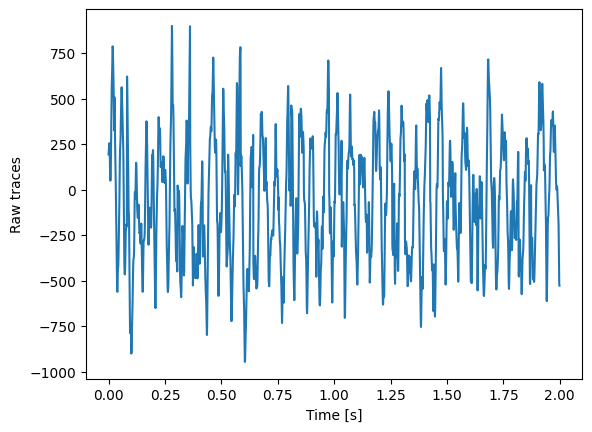

In [15]:
# Electrophysiology traces - LFP
time_series = nwbfile.processing["ecephys"].data_interfaces["LFP"].electrical_series['ElectricalSeries']
plt.plot(
    np.arange(0, 2000) / time_series.rate,
    time_series.data[0:2000, 17],
)
plt.xlabel('Time [s]')
plt.ylabel('Raw traces')

In [22]:
# Electrodes table
df_e = time_series.electrodes[:]
df_e

,location,group,group_name,channel_name,rel_y,rel_x
id,,,,,,
0,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD01,0.0,450.0
1,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD02,0.0,600.0
2,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD03,150.0,150.0
3,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD04,150.0,300.0
4,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD05,150.0,450.0
5,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD06,150.0,600.0
6,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD07,150.0,750.0
7,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD08,150.0,900.0
8,unknown,0 pynwb.ecephys.ElectrodeGroup at 0x1404220690...,0,AD09,300.0,0.0


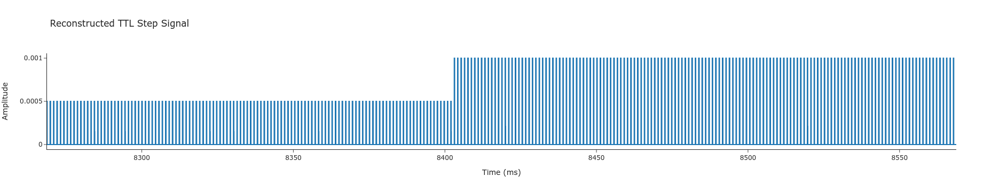

In [10]:
# Optogenetic stimulation
trace = go.Scatter(
    x=nwbfile.stimulus['OptogeneticSeries'].timestamps[-3500000:-3200000],
    y=nwbfile.stimulus['OptogeneticSeries'].data[-3500000:-3200000],
    mode='lines',
    name='TTL Signal'
)
layout = go.Layout(
    title='Reconstructed TTL Step Signal',
    xaxis=dict(title='Time (ms)'),
    yaxis=dict(title='Amplitude'),
)
fig = go.Figure(data=[trace], layout=layout)
fig

In [17]:
# Trials table (stimuli)
df_s = nwbfile.trials.to_dataframe()
df_s

,start_time,stop_time,stimulus_amplitude
id,,,
0,7264.814250,7264.964250,0.0005
1,7266.170150,7266.320150,0.0005
2,7267.290200,7267.440200,0.0005
3,7268.409225,7268.559225,0.0005
4,7269.532200,7269.682200,0.0005
...,...,...,...
3995,11763.014875,11763.164875,0.0040
3996,11764.134900,11764.284900,0.0040
3997,11765.257875,11765.407875,0.0040


In [16]:
# Units table
df = nwbfile.units.to_dataframe()
df

,spike_times,waveform_mean
id,,
0,"[478.0, 666.0, 2823.0, 6502.0, 6704.0, 11057.0...","[-62.0, -52.0, -34.0, -26.0, -23.0, 6.0, 79.0,..."
1,"[13937.0, 15845.0, 17497.0, 18129.0, 20551.0, ...","[109.0, 140.0, 161.0, 175.0, 209.0, 263.0, 298..."
2,"[5496.0, 9517.0, 9579.0, 9773.0, 11611.0, 1227...","[121.0, 174.0, 236.0, 304.0, 382.0, 459.0, 496..."
3,"[354.0, 453.0, 637.0, 1021.0, 1124.0, 1638.0, ...","[441.0, 419.0, 389.0, 369.0, 367.0, 371.0, 366..."
4,"[779.0, 902.0, 3101.0, 11368.0, 14617.0, 15331...","[371.0, 359.0, 329.0, 300.0, 292.0, 308.0, 332..."
5,"[78313.0, 97442.0, 105846.0, 107495.0, 107679....","[365.0, 426.0, 427.0, 365.0, 284.0, 228.0, 208..."
6,"[640.0, 692.0, 1944.0, 3543.0, 5061.0, 6271.0,...","[409.0, 391.0, 345.0, 304.0, 295.0, 308.0, 319..."
7,"[307650.0, 462185.0, 493070.0, 540663.0, 70529...","[87.0, 23.0, -27.0, -44.0, -31.0, 13.0, 92.0, ..."
8,"[120.0, 634.0, 1412.0, 2453.0, 3354.0, 4349.0,...","[381.0, 409.0, 429.0, 417.0, 389.0, 381.0, 391..."


In [27]:
nwb2widget(nwbfile)

In [ ]:
io.close()